#  Where (not) to eat in Chicago? Project milestone 2


In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [0]:
data_folder = "/content/drive/My Drive/ADA"

In [0]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [0]:
import json
import folium
from folium import plugins
from folium.plugins import MarkerCluster, Search

import shapely
from shapely.geometry import shape, Point

We start by reading our data

In [0]:
inspections = pd.read_csv(os.path.join(data_folder, "food-inspections.csv"))

We can now look into the fetures and types of our dataset through a sample :

In [6]:
inspections.head()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location,Historical Wards 2003-2015,Zip Codes,Community Areas,Census Tracts,Wards
0,2346127,CREPE HOUSE CAFE,CREPE HOUSE CAFE,2637127.0,Restaurant,Risk 1 (High),5033 N ELSTON AVE,CHICAGO,IL,60630.0,2019-11-22T00:00:00.000,Canvass Re-Inspection,Pass,NaN,41.972349,-87.746825,"{'latitude': '-87.74682508578468', 'longitude'...",NaN,NaN,NaN,NaN,NaN
1,2346148,EDIBLE ARRANGEMENTS #1250,EDIBLE ARRANGEMENTS #1250,2703497.0,Restaurant,Risk 2 (Medium),1783 W HOWARD ST,CHICAGO,IL,60626.0,2019-11-22T00:00:00.000,License,Pass w/ Conditions,"3. MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL E...",42.019290,-87.675802,"{'latitude': '-87.67580161669515', 'longitude'...",NaN,NaN,NaN,NaN,NaN
2,2346153,PINK'S CHILD CARE ACADEMY III,PINK'S CHILD CARE ACADEMY III,2215653.0,Daycare Combo 1586,Risk 1 (High),2914 W 87TH ST,CHICAGO,IL,60652.0,2019-11-22T00:00:00.000,Canvass,No Entry,NaN,41.735418,-87.695297,"{'latitude': '-87.69529667271209', 'longitude'...",NaN,NaN,NaN,NaN,NaN
3,2346143,SALVATION ARMY TEMPLE HEAD START,SALVATION ARMY TEMPLE HEAD START,2215678.0,Daycare (2 - 6 Years),Risk 1 (High),1 N OGDEN AVE,CHICAGO,IL,60607.0,2019-11-22T00:00:00.000,License,Pass,"44. UTENSILS, EQUIPMENT & LINENS: PROPERLY STO...",41.881437,-87.665921,"{'latitude': '-87.66592135954576', 'longitude'...",NaN,NaN,NaN,NaN,NaN
4,2346126,LEANS NUTRITION CLUB,LEANS NUTRITION CLUB,2432147.0,Restaurant,Risk 2 (Medium),5302 S PULASKI RD,CHICAGO,IL,60632.0,2019-11-22T00:00:00.000,Canvass Re-Inspection,Pass w/ Conditions,"3. MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL E...",41.796699,-87.723408,"{'latitude': '-87.72340756196249', 'longitude'...",NaN,NaN,NaN,NaN,NaN


In [7]:
inspections.columns

Index(['Inspection ID', 'DBA Name', 'AKA Name', 'License #', 'Facility Type',
       'Risk', 'Address', 'City', 'State', 'Zip', 'Inspection Date',
       'Inspection Type', 'Results', 'Violations', 'Latitude', 'Longitude',
       'Location', 'Historical Wards 2003-2015', 'Zip Codes',
       'Community Areas', 'Census Tracts', 'Wards'],
      dtype='object')

First thing we notice is the strange presence of the columns Historical Wards 2003-2015, Zip Codes, Community Areas, Census Tracts and Wards. These columns all have only NaN values, so we are dropping them:

In [0]:
inspections.drop(columns=['Historical Wards 2003-2015', 'Zip Codes',
       'Community Areas', 'Census Tracts', 'Wards'],inplace=True)

Let's see what are the possible categories of our facilities:

In [9]:
inspections["Facility Type"].unique()

array(['Restaurant', 'Daycare Combo 1586', 'Daycare (2 - 6 Years)',
       'HAIR SALON', "Children's Services Facility", 'GROCERY STORE',
       'BREWERY', 'Grocery Store', 'Daycare (2 Years)', 'Bakery',
       'Mobile Food Preparer', 'tavern',
       'Daycare Above and Under 2 Years', nan, 'School', 'PALETERIA',
       'Long Term Care', 'HERBALIFE', 'Catering', 'MOBILE FOOD',
       'BANQUET', 'BUTCHER SHOP', '15 monts to 5 years old',
       'CUSTOM POULTRY SLAUGHTER', 'GAS STATION/GROCERY', 'Liquor',
       'COFFEE SHOP', 'HOSTEL', 'Pop-Up Food Establishment User-Tier II',
       'VENDING COMMISSARY', 'LIVE POULTRY', 'Daycare (Under 2 Years)',
       'Shared Kitchen', 'Hospital', 'ICE CREAM',
       'Pop-Up Establishment Host-Tier II', 'CHARTER SCHOOL',
       'Mobile Food Dispenser', 'CHILDRENS SERVICES FACILITY',
       'RESTAURANT/BAR', 'GYM', 'TAVERN', "CHILDERN'S SERVICE FACILITY",
       'Golden Diner', 'GROCERY STORE /PHARMACY', 'ASSISTED LIVING',
       'Airport Lounge', "10

We can notice very different facility types; as we want to analyze only restaurants we will keep only entries where "Restaurant" is the Facility Type. Let's see if we have any entries with missing Facility Type:

In [10]:
print("There are {0} missing values for Facility Type in the dataset".format(len(inspections[inspections["Facility Type"].isna()])))

There are 4764 missing values for Facility Type in the dataset


For now we will get rid of those rows as they are of no use to us:

In [0]:
inspections = inspections.dropna(subset=["Facility Type"])

We only want to analyze entries which correspond to restaurants so we will keep only those rows

In [0]:
# Keep only restaurants for the rest of the analysis
inspections = inspections[inspections["Facility Type"].str.contains("restaurant", case=False)]

In [13]:
print(f"We have {len(inspections)} rows in our dataset, each row corresponds to one inspection")

We have 131190 rows in our dataset, each row corresponds to one inspection


Since we are going to compare inspection's results over time, let's look at the time range we have for the inspections.

In [0]:
# Cast Inspection Date to Datetime type
inspections['Inspection Date'] = pd.to_datetime(inspections['Inspection Date'])

In [15]:
print('The first inspection in the dataset happened in {0}, and the last one happened was on {1}'. 
      format(inspections['Inspection Date'].min().strftime("%d.%m.%Y"), inspections['Inspection Date'].max().strftime("%d.%m.%Y.")))

The first inspection in the dataset happened in 04.01.2010, and the last one happened was on 22.11.2019.


## Data preprocessing

We will now proceed with preparing the dataset for the analysis. Below we take the following preprocessing steps:
1. Making Licence # column a unique identifier of restaurants in the dataset.
2. Fixing the zip codes by completing the missing values based on the values of Longitude and Latitude.
3. Fixing the City column by completing the missing values based on the zip code.
4. Standardizing the Inspection Type values by cleaning various namings and reducing the number of categories.

### Making unique licenses

The original dataset we have is inspections-oriented, but our analysis will be mainly focused on restaurants. That is why we need a feature which will help us uniquely identify each restaurant.

In [16]:
print(f"Using DBA Name we can see there are {inspections['DBA Name'].nunique()} distinct restaurant names")

Using DBA Name we can see there are 14228 distinct restaurant names


In [17]:
print(f"Using restaurant Licenses we can see there are {inspections['License #'].nunique()} distinct restaurants")

Using restaurant Licenses we can see there are 20022 distinct restaurants


We have probably many non unique names due to restaurants such as McDonalds and other large food-serving chains. We want to make the license number our primary key for restaurant identification as we assume different restaurants have different license numbers. First, let's check if there are any missing values in this column:

In [18]:
print(f"There are {inspections['License #'].isna().sum()} restaurant that have NaN licence number")

There are 0 restaurant that have NaN licence number


We noticed however that there are some restaurant with licence numbers equal to 0, let's see how many there are:

In [19]:

print(f"There are {len(inspections[inspections['License #'] == 0.0])} restaurant that have zero licence number")

There are 114 restaurant that have zero licence number


As we can see, there is no column that can help us uniquely identify a restaurant. The closest match is License # feature, which has some restaurants with 0 assigned as their license number. We decided to add fake licence numbers and use it as a restaurant identifier later on.

In [0]:
# Get entries where License number is missing
zero_license = inspections[inspections["License #"] == 0.0]

In [21]:
zero_license.nunique()

Inspection ID      114
DBA Name            63
AKA Name            50
License #            1
Facility Type        3
Risk                 3
Address             63
City                 2
State                1
Zip                 33
Inspection Date    108
Inspection Type      9
Results              6
Violations          74
Latitude            62
Longitude           62
Location            62
dtype: int64

To be able to identify restaurants with license number equal to 0, we will assume that no two of such restaurants share the same location and the same name. Using this assumption, we can create artificial license numbers for restaurants with missing license numbers:

In [0]:
# Get the maximum license number that exists in the database and use it as starting point for the newly generated license numbers
start_id = int(inspections["License #"].max() + 1)
missing_licenses = inspections[(inspections["License #"] == 0)][["DBA Name","Location"]].copy().drop_duplicates()
missing_licenses["new License"] = [i for i in range(start_id, start_id+len(missing_licenses.drop_duplicates()))]

In [0]:
# Merge dataset
inspections = inspections.merge(missing_licenses, on=["DBA Name","Location"], how='left')

In [0]:
# Populate missing licence numbers with newly generated license numbers
inspections["License #"] = inspections["License #"].apply(lambda x: np.nan if x == 0 else x)
inspections["License #"] = inspections["License #"].fillna(value = inspections["new License"])
inspections.drop(columns=["new License"], inplace=True)

In [25]:
print("There are {0} missing license numbers in our dataset".format(inspections[inspections["License #"] == 0].size))

There are 0 missing license numbers in our dataset


In [0]:
# Cast License number from float to int
inspections["License #"] = inspections["License #"].apply(lambda x : int(x))

### Completing zip codes based on geographical coordinates

The big part of our analysis will be based on neighborhoods, therefore we will hugely rely on the Zip column.

We want to populate the missing Zip values based on the Latitude and Longitude. In order to do that, we must have those two features for all the restaurants in the dataset. That is why we decided to drop all entries where one of those features is missing.

In [0]:
inspections = inspections[~((inspections['Longitude'].isna()) | (inspections['Latitude'].isna()))]

In [28]:
print('There are {0} missing values for Zip column'.format(inspections[inspections['Zip'].isna()].shape[0]))
print('There are {0} missing values for City column'.format(inspections[inspections['City'].isna()].shape[0]))

There are 20 missing values for Zip column
There are 69 missing values for City column


In [0]:
restaurants_zip_na = inspections[inspections['Zip'].isna()]

To populate Zip values based on coordinates, we use [shapely](https://pypi.org/project/Shapely/) - Python package for manipulation and analysis of planar geometric objects.

In [0]:
# Function that creates points from Latitude and Longitude
def create_points(df):
    coords = list(zip(df['Longitude'], df['Latitude']))
    res = []
    for coord in coords:
        res.append(shapely.geometry.Point(coord))
    return res

In [0]:
# Create list of points for which we want to get Zip code
points = create_points(restaurants_zip_na)

In [0]:
# Method which checks whether the points are in area described in geojson file and returns data with zip value for found points
def populate_missing_zip(points, geojson_filename):
    # load GeoJSON file containing sectors
    state_geo_path = r'{0}'.format(geojson_filename)
    geo_json_data = json.load(open(state_geo_path))

    zip_found = []
    # check each polygon to see if it contains the point
    for feature in geo_json_data['features']:
        polygon = shapely.geometry.shape(feature['geometry'])
        for point in points: 
            if polygon.contains(point):
                point_complete = {'Longitude':point.x, 'Latitude':point.y, 'Zip':feature.get('properties', {}).get('zip')}
                zip_found.append(point_complete)
    return zip_found

In [33]:
# Find missing Zip values
zip_found = populate_missing_zip(points, os.path.join(data_folder, 'chicago-zip.json'))
print('Total {0} point found matching Chicago sectors.'.format(len(zip_found)))

Total 20 point found matching Chicago sectors.


In [34]:
zip_found = pd.DataFrame(zip_found)
zip_found.head()

,Longitude,Latitude,Zip
0,-87.673459,42.019032,60626
1,-87.673459,42.019032,60626
2,-87.673459,42.019032,60626
3,-87.659816,41.968491,60640
4,-87.659816,41.968491,60640


Now, we have to merge those results with the original dataset.

In [0]:
# Before merging, drop duplicate points
zip_found.drop_duplicates(inplace=True)

In [0]:
inspections = inspections.merge(zip_found,on=['Latitude','Longitude'], how='left',suffixes=('', '_notnull'))
inspections.Zip.fillna(value=inspections.Zip_notnull, inplace=True)
inspections.drop(columns=["Zip_notnull"], inplace=True)

In [37]:
print('There are {0} missing Zip left in the restaurant dataset.'.format(inspections[inspections.Zip.isnull()].shape[0]))

There are 0 missing Zip left in the restaurant dataset.


In [0]:
# Change type of Zip feature from float to string
inspections['Zip']=inspections['Zip'].apply(lambda x: str(int(x)))

### Completing City column based on zip codes

We will also fix the City column. Now we can use the Zip column to fill in the missing information about the city.

In [0]:
# Function that returns all Chicago Zips frem geojson file
def create_chicago_zip_list():
    state_geo_path = os.path.join(data_folder, "chicago-zip.json")
    geo_json_data = json.load(open(state_geo_path))

    zips = []
   
    for feature in geo_json_data['features']:
        zips.append(str(feature.get('properties', {}).get('zip')))
    return set(zips)

In [0]:
# Get list of all Zip codes in Chicago
chicago_zip = create_chicago_zip_list()

In [41]:
# Check if there is any restaurant not in Chicago
not_in_chicago = len(inspections[inspections.City.isna() & (~inspections.Zip.isin(chicago_zip))])
print('There are {0} Zip values which are not in Chicago.'.format(not_in_chicago))

There are 0 Zip values which are not in Chicago.


In [0]:
# Replace all City missing values with Chicago
inspections.City.fillna(value='Chicago', inplace=True)

In [43]:
print('There are {0} missing City values left in the restaurant dataset.'.format(inspections[inspections.City.isnull()].shape[0]))

There are 0 missing City values left in the restaurant dataset.


In [44]:
inspections.City.unique()

array(['CHICAGO', 'Chicago', 'CCHICAGO', 'CHICAGO.', 'CHICAGOHICAGO',
       'chicago', 'CHICAGOCHICAGO', '312CHICAGO', 'CHICAGOI'],
      dtype=object)

In [45]:
# Change all values for City column to be Chicago
inspections.City = 'Chicago'
inspections.City.unique()

array(['Chicago'], dtype=object)

### Standardizing/cleaning Inspection Type values

In [46]:
inspections['Inspection Type'].unique()

array(['Canvass Re-Inspection', 'License', 'Canvass', 'Complaint',
       'License Re-Inspection', 'Short Form Complaint',
       'Complaint Re-Inspection', 'Suspected Food Poisoning',
       'Recent Inspection', 'Suspected Food Poisoning Re-inspection',
       'Consultation', 'Non-Inspection', 'Recent inspection',
       'fire complaint', 'FIRE', 'Tag Removal', nan, 'Not Ready',
       'License-Task Force', 'Complaint-Fire Re-inspection',
       'Complaint-Fire', 'Short Form Fire-Complaint',
       'KITCHEN CLOSED FOR RENOVATION', 'CORRECTIVE ACTION',
       'LICENSE CANCELED BY OWNER', 'Task Force Liquor 1475',
       'TWO PEOPLE ATE AND GOT SICK.', 'Pre-License Consultation',
       'CANVASS SPECIAL EVENTS', 'OUT OF BUSINESS', 'No entry',
       'NO ENTRY', 'Package Liquor 1474', 'Sample Collection',
       'FIRE/COMPLAIN', '1315 license reinspection',
       'Task Force Liquor Catering', 'SFP', 'CANVAS', 'no entry',
       'SFP/COMPLAINT', 'SFP/Complaint', 'Special Events (Festival

Looking at `Inspection Type` values we can see that they need some cleaning. According to the [document describing the dataset](https://data.cityofchicago.org/api/assets/BAD5301B-681A-4202-9D25-51B2CAE672FF) we should have following inspection types:
 - **canvass**: regular inspections with frequency depending on establishment risk,
 - **complaint**: in a response to filed complaint,
 - **license**: when obtaining a license, as a requirement of launching the establishment (should be once for most or more if they failed, this might be a separate study case),
 - **suspect food poisoning**: specific type of *complaint* when someone reports getting ill after eating from there
 - **task-force**: for bars and taverns.

Also, as the linked document states, re-inspections can be done for most of the types and are indicated in the name of inspection type.

First, we replace NaN values in Inspection Type with "Unknown":

In [0]:
inspections.fillna(value={'Inspection Type': 'Unknown'}, inplace=True)

Now, since we may want to use the indication whether a particular inspection was a re-inspection or not, we add a separate column that will indicate that:

In [0]:
reinspection_pattern = 're-inspec|reinspec|re inspec'
inspections['Re-inspection'] = inspections['Inspection Type'].str.lower().str.contains(reinspection_pattern, regex=True)

Now, we proceed with making the names for given types of inspections uniform:

In [0]:
inspection_types = inspections['Inspection Type'].unique().astype(str)
inspection_types_lower = np.char.lower(inspection_types)

In [0]:
# Replaces values in Inspection Type for records with keywords found in them with the specified replacement value
def standardize_by_finding_keyword(keywords, replacement):
  to_replace = np.array([])
  for keyword in keywords:
    to_replace = np.append(to_replace, inspection_types[np.char.find(inspection_types_lower, keyword) != -1])
  inspections['Inspection Type'] = inspections['Inspection Type'].replace(to_replace, value=replacement)

In [0]:
standardize_by_finding_keyword(['canvas'], 'Canvass')
standardize_by_finding_keyword(['complain'], 'Complaint')
standardize_by_finding_keyword(['license'], 'License')
standardize_by_finding_keyword(['task', 'liquor'], 'Task Force')

In [0]:
# Suspected Food Poisoning replacements
sfp_values = inspections['Inspection Type'].str.lower().str.contains('food|sfp', regex=True)
inspections.loc[sfp_values, 'Inspection Type'] = 'Suspected Food Poisoning'
standardize_by_finding_keyword(['sick'], 'Suspected Food Poisoning')

In [53]:
inspections.groupby(by='Inspection Type')['Inspection ID'].count()

Inspection Type
CHANGED COURT DATE                   1
CORRECTIVE ACTION                    1
Canvass                          83948
Complaint                        25119
Consultation                       394
FIRE                                 1
HACCP QUESTIONAIRE                   1
KITCHEN CLOSED FOR RENOVATION        1
License                          19528
NO ENTRY                             5
No Entry                            48
No entry                             1
Non-Inspection                       9
Not Ready                            7
OUT OF BUSINESS                     11
Out of Business                     53
POSSIBLE FBI                         1
RE-INSPECTION OF CLOSE-UP            1
REINSPECTION                         1
Recent Inspection                  229
Recent inspection                    1
Sample Collection                    1
Special Events (Festivals)          21
Suspected Food Poisoning           919
TASTE OF CHICAGO                     1
Tag Remov

There are still a lot of values that appear only once in the entire dataset. There are also ones that could be merged into single categories (e.g. "no entry", "out of business", "recent inspection"). We also decide to leave the categories with significant amount of records, such as "Consultation". The ones we decide to drop will be reclassified under "Unknown" category.

In [0]:
# Replaces records with keyword found in category name to be classified in a given target category
def merge_categories(keyword, target_category):
  categories_containing_keyword = inspections['Inspection Type'].str.lower().str.contains(keyword)
  inspections.loc[categories_containing_keyword, 'Inspection Type'] = target_category  

In [0]:
merge_categories('recent inspection', 'Recent Inspection')
merge_categories('out of business', 'Out of Business')
merge_categories('no entry', 'No Entry')

In [0]:
known_list = ['License', 'Canvass', 'Complaint', 'Consultation', 'No Entry', 'Out of Business', 'Recent Inspection', 'Suspected Food Poisoning', 'Tag Removal', 'Task Force']
# Classify the rest as unknown
inspections.loc[~inspections['Inspection Type'].isin(known_list), 'Inspection Type'] = 'Unknown'

In [57]:
inspections.groupby(by='Inspection Type')['Inspection ID'].count()

Inspection Type
Canvass                     83948
Complaint                   25119
Consultation                  394
License                     19528
No Entry                       56
Out of Business                64
Recent Inspection             230
Suspected Food Poisoning      919
Tag Removal                   483
Task Force                    225
Unknown                        51
Name: Inspection ID, dtype: int64

Additionally, let's propagate "Out of Business" indication to "Results" column where it should be indicated:

In [0]:
out_of_business = inspections[inspections['Inspection Type'] == 'Out of Business'].index
inspections.loc[out_of_business, 'Results'] = 'Out of Business'

## Descriptive analysis

In this part we prepare some basic plots to get more visual insight in our dataset.

In [0]:
sns.set(rc={'figure.figsize':(10,6)})
sns.set_style("whitegrid")

We start with number of inspections per year to see if we can observe any trend in that matter

Text(0.5, 1.0, 'Number of inspections per year')

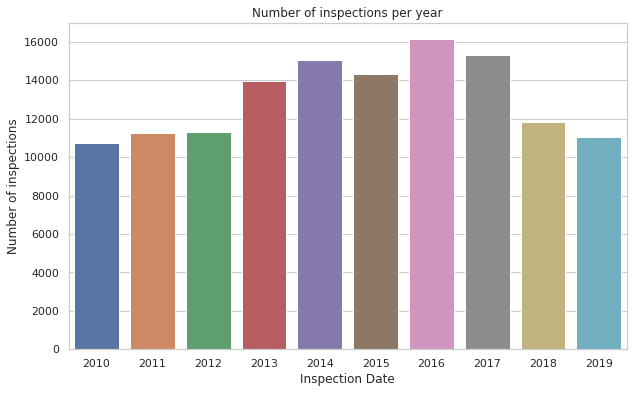

In [60]:
data = inspections.groupby(inspections["Inspection Date"].dt.year)["Inspection ID"].count().to_frame().reset_index()
data = data.rename(columns={"Inspection ID": "Number of inspections"})
sns.barplot(data["Inspection Date"], data["Number of inspections"]).set_title("Number of inspections per year")

Next we want to look into inspections results each year

Text(0.5, 1.0, 'Number of inspections by result per year')

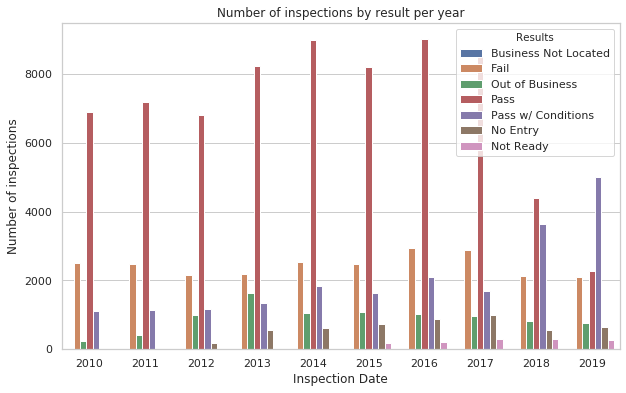

In [61]:
data = inspections.groupby([inspections["Inspection Date"].dt.year, inspections["Results"]])["Inspection ID"].count().to_frame().reset_index()
data = data.rename(columns={"Inspection ID": "Number of inspections"})
sns.barplot(data["Inspection Date"], data["Number of inspections"], data["Results"]).set_title("Number of inspections by result per year")

It seems that Chicago sanitary got more strict as we can see in 2018 and 2019 far less restaurants pass an inspection in favour of passing with conditions.
Furthermore we want to see how many inspections results correspond to which Risk level.

Text(0.5, 1.0, 'Number of inspections per year by risk level')

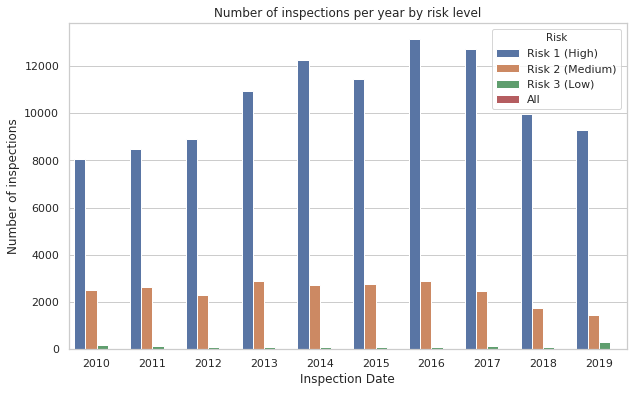

In [62]:
data = inspections.groupby([inspections["Inspection Date"].dt.year, inspections["Risk"]])["Inspection ID"].count().to_frame().reset_index()
data = data.rename(columns={"Inspection ID": "Number of inspections"})
sns.barplot(data["Inspection Date"], data["Number of inspections"], data["Risk"]).set_title("Number of inspections per year by risk level")

We can see that most of inspections end up with giving restaurants a high risk badge, there are very few inspections with low risk, this is even more interesting as we identified earlier that most inspections are the ones that were passed.

## Research questions

Below we present data analysis for each of the research questions we defined. These analysis leads to initial answers to these questions, we also describe one question we decided to drop (see Question 5). At the end of data analysis for each research question, we briefly describe what will/can be done with regards to the posed question.

### Question 1
**What are the most common reasons for a restaurant not passing an inspection?**

In our dataset violations detected during the inspections are noted in the Violations column. Each violation contains a code, general violation description (name/category of the violation) and comments added by the inspector. Since the violation codes uniquely identify a particular violation, we extract them and use them for our analysis.

However, as indicated in the [linked document](http://dev.cityofchicago.org/open%20data/data%20portal/2018/06/29/food-violations-changes.html) from the dataset page, the violation codes and descriptions has changed as of 1/07/2018. This means, that violation codes before and after this date don't correspond to the same violation reason. We first tried to map the changed values to the old ones, but it did not give results we expected (there are many new violations added and also the meaning of many violation changed). Therefore we need to split our analysis into two parts, so that violation codes in each part are consistent - analyze the inspections before 1/07/2018 and after this day.

What we also wanted to do in this part was to categorize these violation reasons into bigger, more general groups. Categorizing violations into smaller number of groups would help us understand the highlevel reasons for failing the inspection better and would also help in creating visualizations easier to understand. That is why we manually grouped all violation codes into **5 categories** (using the violation descriptions for understanding what each violation code means):
1. **Food violations:** in this category we put all of the violations which are related to the food and ingredients: the way they are obtained, stored, transported, prepared, labeled etc.
2. **Facility conditions related violations:** presence of appropriatelly set up equipment and utilities (freezer, owens, work surface etc.), as well as requirements for the building and infrastructure (lighting, ventilation, temperature, pipes, walls etc.).
3. **Sanitary related violations:** violations that are related to keeping all the equipment, rooms and surfaces clean .
4. **Staff related violations:** violations related to the employees (necesarry trainings, the way they work with food, manager's work etc.).
5. **Other:** the violations that did not match the previous groups (eg. summary report of the inspection visible to the public, no smoking regulations etc.).

#### Analysis on original violation codes

To perform analysis on violations we first need to extract their codes to easily identify violations for each inspection:

In [0]:
inspections.fillna(value={'Violations': ''}, inplace=True)

In [0]:
# Extract violation codes from textual list of violations
def extract_violation_codes(violation):
    violations_list = list(map(lambda v: v.strip(), violation.split('|')))
    violation_dots = [violation.find('.') for violation in violations_list]
    # using set to get rid of multiple same category violations per inspection (to not disturb the distributions)
    violation_codes = list(set([int(v[:idx]) for v, idx in zip(violations_list, violation_dots) if idx != -1]))
    return violation_codes

In [0]:
# Add additional column with extracted codes
inspections['Violation Codes'] = inspections['Violations'].apply(extract_violation_codes)

In [0]:
# Merges all violation codes from the column into one flat array
def merge_violation_codes(violation_series):
  return [code for inspection_violation_codes in violation_series.values for code in inspection_violation_codes]

# Creates the histogram for violation codes
def violation_counts(violations, max_violation_code):
  counts, code_bins = np.histogram(violations, bins=np.arange(1, max_violation_code + 2))
  return counts, code_bins

# Creates violation codes distribution from the dataframe
def violations_distribution(df, violation_column='Violation Codes', max_violation_code=70):
  # https://stackoverflow.com/a/38258158
  all_codes = merge_violation_codes(df[violation_column])
  counts, code_bins = violation_counts(all_codes, max_violation_code)
  return code_bins[:-1], counts

In [0]:
# Split the dataset regarding the change of violation definitions
violation_change_date = pd.Timestamp(year=2018, month=7, day=1)
inspections['Inspection Date'] = pd.to_datetime(inspections['Inspection Date'])
inspections_before_change = inspections[inspections['Inspection Date'] < violation_change_date]
inspections_after_change = inspections[inspections['Inspection Date'] >= violation_change_date]

In [0]:
def plot_violations_stacked_bars(data, title, violation_column='Violation Codes', max_violation_code=70, xticks=None):
  plt.figure(figsize=(12, 7))
  plt.title(title)

  results = data['Results'].unique()
  bars = []
  previous_counts = np.zeros((max_violation_code,))
  # create stacked bar chart
  for result in results:
    bins, counts = violations_distribution(data[data['Results'] == result], violation_column, max_violation_code)
    bar = plt.bar(bins, counts, bottom=previous_counts)
    bars.append(bar[0])
    # accumulate counts for positioning next stack
    previous_counts += counts
  
  if xticks is not None:
    plt.xticks(np.arange(1, max_violation_code + 1), xticks, rotation=40)
  else:
    plt.xlabel('Violation code')

  plt.ylabel('# of inspections with violations')
  plt.ylim((0, int(np.max(previous_counts)) + 2000))

  plt.legend(tuple(bars), tuple(results))
  plt.grid(True, axis='y')

  plt.show()

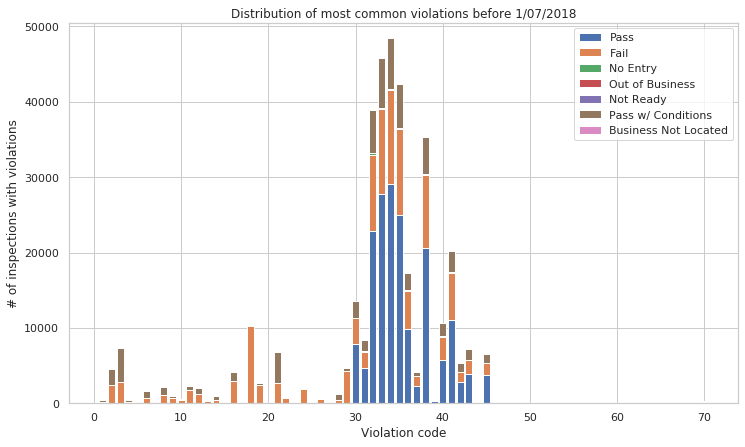

In [69]:
plot_violations_stacked_bars(inspections_before_change, 'Distribution of most common violations before 1/07/2018')

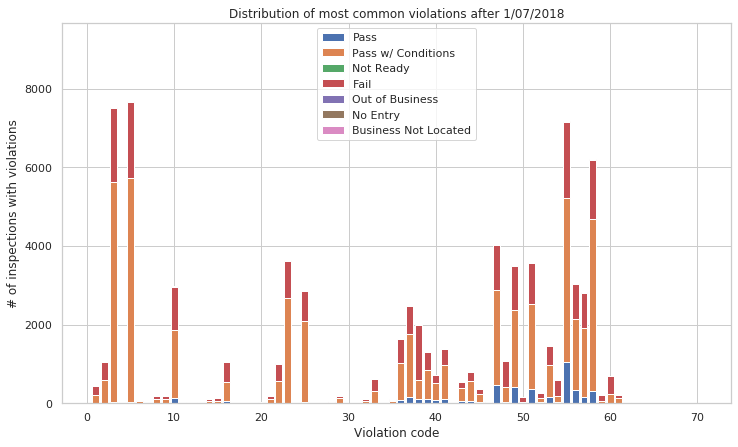

In [70]:
plot_violations_stacked_bars(inspections_after_change, 'Distribution of most common violations after 1/07/2018')

In [0]:
# Focus only on failed inspections
failed_inspections_before = inspections_before_change[inspections_before_change['Results'] == 'Fail']
failed_inspections_after = inspections_after_change[inspections_after_change['Results'] == 'Fail']

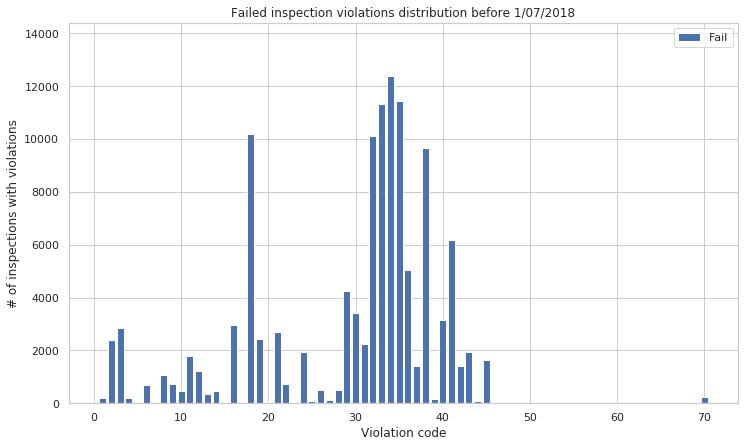

In [72]:
plot_violations_stacked_bars(failed_inspections_before, 'Failed inspection violations distribution before 1/07/2018')

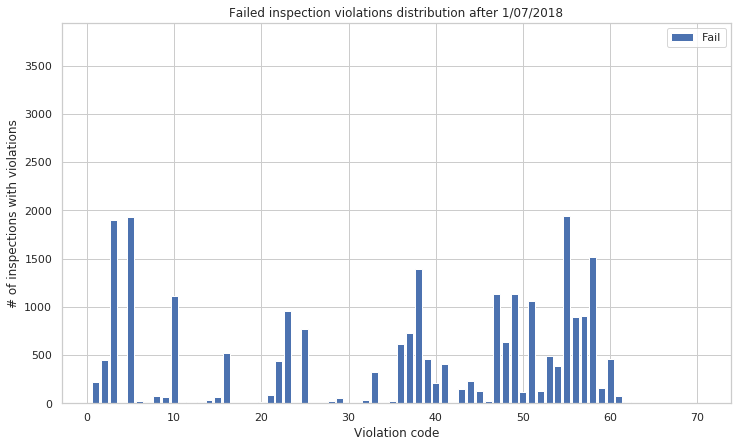

In [73]:
plot_violations_stacked_bars(failed_inspections_after, 'Failed inspection violations distribution after 1/07/2018')

The plots above show what are the most common violations for inspections both in general and only when focusing on failed inspections. In the first plot we can also see that violation with code 18 is almost always associated with a failed inspection. In the same plot it is also appartent, that violations with codes 32-35 and 38 are very often, but also most of such inspections end with a pass. We can also note that after the change of violations there are indeed not that many inspections with some violations and still getting a clear pass.

#### Analysis on generalized inspection codes

Now we convert the original violation codes into defined 5 categories:

In [0]:
food_codes_before = [1, 3, 15, 16, 17, 30]
facility_codes_before = [2, 7, 9, 11, 13, 14, 18, 22, 23, 24, 25, 26, 29, 32, 34, 35, 36, 37, 38, 40, 42, 43]
sanitary_codes_before = [4, 8, 10, 12, 19, 20, 27, 31, 33, 39, 41]
staff_codes_before = [5, 6, 21, 44, 45]
unknown_codes_before = [28, 70]

codes_before = [food_codes_before, facility_codes_before, sanitary_codes_before, staff_codes_before, unknown_codes_before]

In [0]:
food_codes_after = [11, 12, 13, 14, 15, 17, 23, 26, 27, 28, 30, 31, 37, 39, 42]
facility_codes_after = [10, 18, 19, 20, 21, 22, 33, 35, 36, 38, 41, 43, 44, 48, 50, 51, 53, 55, 56, 59, 60, 62]
sanitary_codes_after = [2, 8, 16, 40, 45, 46, 47, 49, 52, 54]
staff_codes_after = [1, 3, 7, 9, 25, 57, 58]
unknown_codes_after = [4, 5, 6, 24, 29, 32, 61, 63]

codes_after = [food_codes_after, facility_codes_after, sanitary_codes_after, staff_codes_after, unknown_codes_after]

In [0]:
# Based on the above array creates mappings between original codes and generalized categories
def create_mapping(codes):
  mapping = {}
  for new_code, category_codes in enumerate(codes):
      for old_code in category_codes:
          mapping[old_code] = new_code + 1  # new codes starting from 1
  return mapping

# Function to transform array of original codes into our categories
def encode_violations(violations, mapping):
  encoded = []
  for violation in violations:
    encoded.append(mapping[violation])
  return encoded

In [0]:
# Create mappings for conversion
before_mapping = create_mapping(codes_before)
after_mapping = create_mapping(codes_after)

In [0]:
mapped_inspections_before_change = inspections_before_change['Violation Codes'].apply(encode_violations, mapping=before_mapping)
mapped_inspections_after_change = inspections_after_change['Violation Codes'].apply(encode_violations, mapping=after_mapping)

In [0]:
mapped_inspections = mapped_inspections_before_change.append(mapped_inspections_after_change)
# Add additional column with violation codes by our general categories
inspections = inspections.merge(mapped_inspections, left_index=True, right_index=True, suffixes=('', ' Generalized'))

Now we can present similar plots as before, but for generalized categories. Also, now we can plot the distributions of violations in these categories for our entire dataset on the same plot:

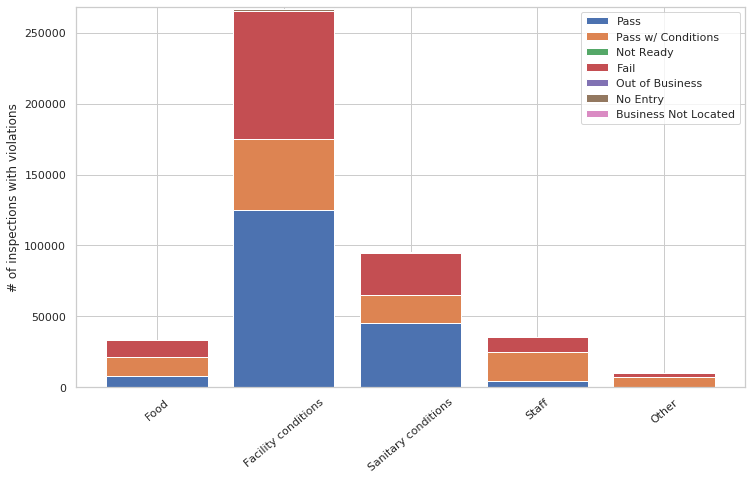

In [80]:
labels = ['Food', 'Facility conditions', 'Sanitary conditions', 'Staff', 'Other']
plot_violations_stacked_bars(inspections, '', violation_column='Violation Codes Generalized', max_violation_code=5, xticks=labels)

We can see that most inspections with violations are related to the violations we clasiffied as facility conditions. Clearly the reason is mostly the fact, that this category is mapped to from many of the original violation codes. Original violation codes assigned to new category "Facility conditions" form the biggest groups within the full sets of original violation codes.

It will be also interesting to analyze violations in inspection results by neighbourhood to potentially discover patterns (e.g. areas larger than one neighbourhood that have inspections with particular violation as the most common one). Below are the functions for perfoming such analysis:

In [0]:
# Get violation codes list for each neighbourhood (zip code)
def violation_codes_by_neighbourhood(data, violation_column):
  return data.groupby(by='Zip')[violation_column].apply(merge_violation_codes)

# Find top most common violations in given violations list
def most_common_violations(violations, top=1):
  counts, _ = violation_counts(violations)
  return np.argsort(counts)[::-1][:top] + 1  # add one to convert to violation code from index

# Find top most common violations in each neighbourhood (zip code)
def most_common_violations_by_neighbourhood(data, top=1):
  return violation_codes_by_neighbourhood(data).apply(most_common_violations, top=top)

#### Milestone 3 goals

For the next milestone we are going to analyze spatial patterns within Chicago for the most common violations per neighborhood. Also, violations discovered during inspections can serve as another measure for ranking places where to eat in Chicago, i.e. we can use percentage of passed inspections or (more detailed) percentage of passed inspections with no food related violations for gauging the quality and safety of restaurants in particular neighbourhood. Establishing such additional measures may help us in responding to the main project question based on not that commonly analyzed aspects and propose safe to eat neighbourhoods based on such measure.

### Question 2
**Are there "safe to eat" areas or "dangerous to eat" areas in Chicago?**

As a first criteria for measuring whether neighborhood is "safe to eat" or "dangerous to eat", we will take into account the aggregate results of inspections for the restaurants in that area.

In [82]:
inspections['Results'].unique()

array(['Pass', 'Pass w/ Conditions', 'Not Ready', 'Fail',
       'Out of Business', 'No Entry', 'Business Not Located'],
      dtype=object)

In [83]:
# Get contigency table
inspections_scores_by_zip = inspections.groupby(['Zip','Results']).size().unstack('Results', fill_value=0)
inspections_scores_by_zip.head()

Results,Business Not Located,Fail,No Entry,Not Ready,Out of Business,Pass,Pass w/ Conditions
Zip,,,,,,,
60601,2,354,18,36,167,1928,402
60602,0,177,9,15,55,796,178
60603,0,258,7,20,94,1077,280
60604,0,147,11,11,65,716,179
60605,0,427,48,27,219,1473,385


We decided to create a formula which will give the overall score for each neighborhood, taking into account the number of inspections per each category, as well as penalizing the negative results and awarding the positive ones. 
If the restaurant was suspended, which means Out of Business or Business Not Located (according to the docs), that gives -2 point. If the restaurant failed, it will be -1 points. If it passes with condition, the score is 0.5 points. If the restaurant passed clearly, it gives 1 point. We then divide that by the total amount of restaurants in the neighborhood.

In [0]:
# Function that gives the safety score for the neighborhood
def get_safety_score(df):
    score = (-2)*df['Business Not Located']+(-2)*df['Out of Business']+(-1)*df['Fail']+0.5*df['Pass w/ Conditions']+1*df['Pass'] 
    number_of_inspections = df.sum(axis=1)
    return score/number_of_inspections

In [85]:
# Add safety score to DF
inspections_scores_by_zip['Safety score'] = pd.Series(get_safety_score(inspections_scores_by_zip))
inspections_scores_by_zip.sort_values('Safety score', ascending=False).head()

Results,Business Not Located,Fail,No Entry,Not Ready,Out of Business,Pass,Pass w/ Conditions,Safety score
Zip,,,,,,,,
60666,0,291,5,21,60,1564,356,0.579451
60601,2,354,18,36,167,1928,402,0.494324
60602,0,177,9,15,55,796,178,0.486179
60638,0,228,37,8,118,1223,227,0.473927
60604,0,147,11,11,65,716,179,0.468113


Now, we want to visualise the results in order to see if there is any pattern.

In [0]:
# We need Zip to be a column in order to visualize, and Zip must be string
inspections_scores_by_zip.reset_index(level=0,inplace=True)
inspections_scores_by_zip['Zip'] = inspections_scores_by_zip['Zip'].apply(lambda x: str(x))

In [87]:
# Visualise neighorhoods with respect to the Safety Score they got
state_geo_path = os.path.join(data_folder, "chicago-zip.json")
geo_json_data = json.load(open(state_geo_path))

map_safe_danger = folium.Map(location=[41.8781, -87.6298], zoom_start=10)
map_safe_danger.choropleth(geo_data=geo_json_data, data=inspections_scores_by_zip,
             columns=['Zip', 'Safety score'],
             key_on='feature.properties.zip',
             fill_color='YlGn', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Safe to eat percentage (%)')
map_safe_danger
#map_safe_danger.save('safe-vs-dangerous-map.html')

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


According to the safety scores we calculated, it seems that the safest places to eat are the **the two Airports and the City Center.** That's right, you may need to pay extra, since those are central tourist points, but you can be quite sure that the restaurant you are eating is fulfulling the regulations. As you are going further from this places, the risk increases. 


#### Milestone 3 goals

We plan to explore further the "safe vs. dangerous" areas by choosing several criteria. We plan to check how Risk feature impacts that separation, as well as try to find other metrics which could be relevant for this analysis.

### Question 3
**Checking restaurants history of inspections, how are restaurants or whole areas changing in their inspection scores? Can one see any patterns in improvements with respect to inspection results? Are there areas/restaurant chains/restaurant types that follow some trends?**

Let's start by a look at the possible inspection results :

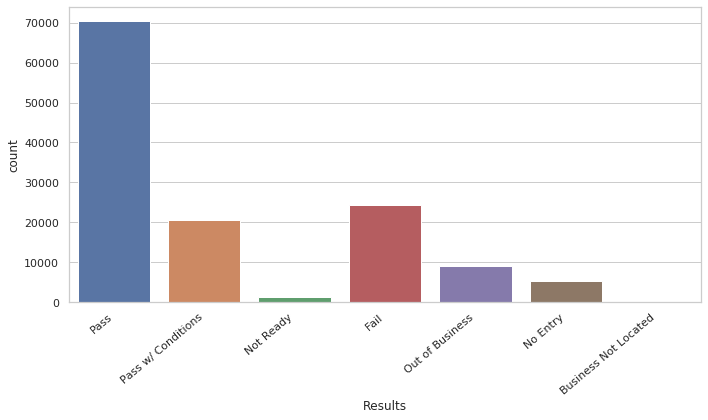

In [88]:
ax = sns.countplot(inspections.Results)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()

We will ignore out of service restaurants, and therefore only consider the first three categories: Pass, Pass w/ conditions and Fail.

As a first indicator of restaurant quality, we will use the number of safety violations per inspection.

In [89]:
inspections["nb_violations"] = inspections.apply(lambda row: len(row['Violation Codes']), axis=1)
inspections.sample(5)

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location,Re-inspection,Violation Codes,Violation Codes Generalized,nb_violations
111459,596498,MASALA GRILL,MASALA GRILL,2120472,Restaurant,Risk 1 (High),2948-2950 W DEVON AVE,Chicago,IL,60659,2011-10-07,License,Fail,19. OUTSIDE GARBAGE WASTE GREASE AND STORAGE A...,41.997593,-87.704035,"{'latitude': '-87.7040346324575', 'longitude':...",False,"[32, 33, 34, 35, 70, 40, 19, 27]","[2, 3, 2, 2, 5, 2, 3, 3]",8
124590,284288,PONCITLAN RESTAURANT NO 2,PONCITLAN RESTAURANT NO 2,59563,Restaurant,Risk 1 (High),4003 W ARMITAGE AVE,Chicago,IL,60639,2010-08-12,Canvass,Pass w/ Conditions,3. POTENTIALLY HAZARDOUS FOOD MEETS TEMPERATUR...,41.917054,-87.726709,"{'latitude': '-87.72670903600198', 'longitude'...",False,"[33, 34, 3, 35, 41, 43]","[3, 2, 1, 2, 3, 2]",6
101874,1234705,LAS ISLAS MARIAS,LAS ISLAS MARIAS,1909643,Restaurant,Risk 1 (High),2043-2051 N MILWAUKEE AVE,Chicago,IL,60647,2012-08-17,Canvass,Pass w/ Conditions,28. * INSPECTION REPORT SUMMARY DISPLAYED AND ...,41.918448,-87.689826,"{'latitude': '-87.68982574887923', 'longitude'...",False,"[33, 35, 41, 28, 31]","[3, 2, 3, 5, 3]",5
5907,2290351,ROSA ISELA TACOS Y MAS,ROSA ISELA TACOS Y MAS,2470637,Restaurant,Risk 1 (High),2551 W FULLERTON AVE,Chicago,IL,60647,2019-05-23,Canvass,Fail,"3. MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL E...",41.924751,-87.691801,"{'latitude': '-87.69180094813183', 'longitude'...",False,"[3, 5, 38, 47, 49, 52, 53, 55, 23, 56, 25, 58,...","[4, 5, 2, 3, 3, 3, 2, 2, 1, 2, 4, 4, 1, 4]",14
115336,565382,Carnivale Restaurant,Carnivale Restaurant,1488939,Restaurant,Risk 1 (High),702 W FULTON MARKET,Chicago,IL,60661,2011-06-06,Canvass,Pass w/ Conditions,8. SANITIZING RINSE FOR EQUIPMENT AND UTENSILS...,41.886911,-87.645864,"{'latitude': '-87.64586376051244', 'longitude'...",False,"[34, 35, 38, 8, 31]","[2, 2, 2, 3, 3]",5


Let's compare the number of violations for inspections with results "Pass", "Pass w/ conditions" and "Fail" :

In [90]:
inspections[inspections.Results == "Pass"].nb_violations.describe()

count    70487.000000
mean         2.584391
std          2.057034
min          0.000000
25%          1.000000
50%          2.000000
75%          4.000000
max         13.000000
Name: nb_violations, dtype: float64

In [91]:
inspections[inspections.Results == "Fail"].nb_violations.describe()

count    24391.000000
mean         5.959862
std          3.491110
min          0.000000
25%          4.000000
50%          6.000000
75%          8.000000
max         25.000000
Name: nb_violations, dtype: float64

As expected, the average number of violations is higher for restaurants who failed their inspection. However, an important detail shouldn't be overlooked: quartiles show that some failing restaurants have less violations than passing ones. We will therefore consider two parameters to evaluate how much restaurants improve over time: the difference between the intial average number of violations and the same average number at the last inspection, and their inspection result (Pass, Pass w/ conditions and Fail). 

In [0]:
def nvdiff(group):
    tmp = group.sort_values(by="Inspection Date")
    return (tmp.iloc[-1].nb_violations-tmp.iloc[0].nb_violations)
violations_evo = inspections.groupby("License #").apply(nvdiff)
violations_evo = pd.DataFrame({'License #':violations_evo.index, 'Violations evolution':violations_evo.values})

In [93]:
violations_evo.sample(5)

,License #,Violations evolution
2906,1228221,-4
3604,1474276,-3
9909,2133999,-6
15118,2437719,-3
10266,2147201,-5


We can now compute the average evolution score per zip code (which is the average of the difference between the number of violations at first and last inspections for all restaurants of a given area).

In [94]:
violations_evo_zip = violations_evo.merge(inspections[['License #','Zip']],on='License #', how='left')\
                         .groupby('Zip')['Violations evolution'].mean()
violations_evo_zip = pd.DataFrame({'Zip':violations_evo_zip.index,'evolution':violations_evo_zip.values})
violations_evo_zip.sample(5)

,Zip,evolution
56,60666,-0.683500
46,60651,-1.510786
12,60613,0.490334
4,60605,0.336952
8,60609,-1.411095


In [95]:
state_geo_path = os.path.join(data_folder, "chicago-zip.json")
geo_json_data = json.load(open(state_geo_path))

map_evo = folium.Map(location=[41.8781, -87.6298], zoom_start=10)
map_evo.choropleth(geo_data=geo_json_data, data=violations_evo_zip,
             columns=['Zip', 'evolution'],
             key_on='feature.properties.zip',
             bins=[-4.0,-3.0,-2.0,0.0,1.0,3.0],
             fill_color='BuGn', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Violations number evolution')
map_evo

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


We can see that in most areas, restaurants manage to decrease their number of violations over time. But in a few areas, restaurants have increased their number of violations.

We can also visualize the number of restaurants who have improved, got worse or stagnated over time.

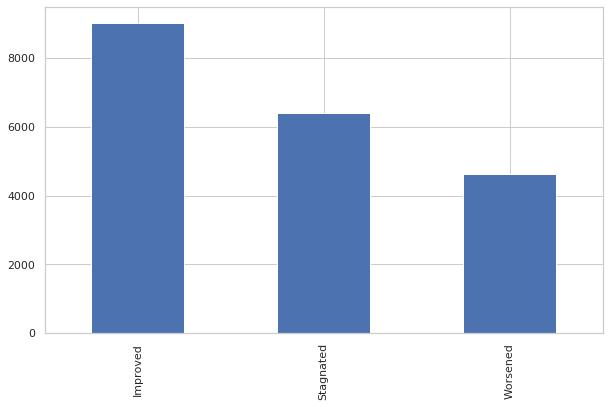

In [96]:
bins = [-np.inf,-0.1,0.1,np.inf]
cats = ["Improved", "Stagnated", "Worsened"]
pd.cut(violations_evo["Violations evolution"], bins, labels=cats).value_counts().plot.bar()

Most restaurants have improved or stagnated over time in their number of violations. The number of restaurants which got worse over time is smaller than the two other categories.

We will now compare the amount of restaurants who passed their most recent inspection in 2010 and 2018, per area. This will give us some insight in restaurant safety evolution over time.

In [97]:
# Number of inspections done in 2010
inspections[(inspections['Inspection Date'] >= '2010-01-01') & (inspections['Inspection Date'] < '2011-01-01')]['License #'].nunique()

6441

In [98]:
# Number of inspections done in 2018
inspections[(inspections['Inspection Date'] >= '2018-01-01') & (inspections['Inspection Date'] < '2019-01-01')]['License #'].nunique()

7412

In [0]:
# Selecting inspections done in 2010 and 2018
chicago_2010 = inspections[(inspections['Inspection Date'] >= '2010-01-01') & (inspections['Inspection Date'] < '2011-01-01')].copy()
chicago_2018 = inspections[(inspections['Inspection Date'] >= '2018-01-01') & (inspections['Inspection Date'] < '2019-01-01')].copy()
chicago_2010["Results"] = chicago_2010["Results"].apply(lambda x : x.startswith("Pass"))
chicago_2018["Results"] = chicago_2018["Results"].apply(lambda x : x.startswith("Pass"))

In [0]:
# Computing number of restaurants which passed their last inspection per zip code

pass_by_zip2010 = chicago_2010.groupby(["License #","Zip"])\
                                .apply(lambda g : g.sort_values(by="Inspection Date").iloc[-1].Results)\
                                .groupby("Zip")\
                                .sum()
pass_by_zip2018 = chicago_2018.groupby(["License #","Zip"])\
                                .apply(lambda g : g.sort_values(by="Inspection Date").iloc[-1].Results)\
                                .groupby("Zip")\
                                .sum()

In [0]:
# Converting counts to int
pass_by_zip2010 = pd.DataFrame({"Zip":pass_by_zip2010.index,"Pass":pass_by_zip2010.values})
pass_by_zip2018 = pd.DataFrame({"Zip":pass_by_zip2018.index,"Pass":pass_by_zip2018.values})
pass_by_zip2010.Pass = pass_by_zip2010.Pass.apply(lambda x : int(x))
pass_by_zip2018.Pass = pass_by_zip2018.Pass.apply(lambda x : int(x))

As not all areas have the same amount of restaurants, for each area we need to divide the number of restaurants passing inspections by the number of restaurants in the area to get a percentage.

In [0]:
zip_count_2010 = chicago_2010.groupby("Zip").apply(lambda g : g["License #"].nunique())
zip_count_2018 = chicago_2018.groupby("Zip").apply(lambda g : g["License #"].nunique())

In [0]:
zip_count_2010 = pass_by_zip2010.merge(pd.DataFrame({"Zip":zip_count_2010.index,"Count": zip_count_2010.values}),on='Zip', how='left')
zip_count_2018 = pass_by_zip2018.merge(pd.DataFrame({"Zip":zip_count_2018.index,"Count": zip_count_2018.values}),on='Zip', how='left')

In [0]:
# Computing pass percentages

zip_count_2010.Pass = zip_count_2010.apply(lambda row : row.Pass/row.Count, axis=1)
zip_count_2018.Pass = zip_count_2018.apply(lambda row : row.Pass/row.Count, axis=1)

In [0]:
zip_count_2010 = zip_count_2010.drop("Count",axis=1)
zip_count_2018 = zip_count_2018.drop("Count",axis=1)

We can now plot the percentage of valid restaurants per area in 2010...

In [106]:
state_geo_path = os.path.join(data_folder, "chicago-zip.json")
geo_json_data = json.load(open(state_geo_path))

map_zip_2010 = folium.Map(location=[41.8781, -87.6298], zoom_start=10)
map_zip_2010.choropleth(geo_data=geo_json_data, data=zip_count_2010,
             columns=['Zip', 'Pass'],
             bins = [0.7,0.75,0.8,0.85,0.9,0.95,1.0],
             key_on='feature.properties.zip',
             fill_color='BuGn', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Percentage of passing restaurants')
map_zip_2010

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


... and in 2018 :

In [107]:
state_geo_path = os.path.join(data_folder, "chicago-zip.json")
geo_json_data = json.load(open(state_geo_path))

map_zip_2018 = folium.Map(location=[41.8781, -87.6298], zoom_start=10)
map_zip_2018.choropleth(geo_data=geo_json_data, data=zip_count_2018,
             columns=['Zip', 'Pass'],
             key_on='feature.properties.zip',
             bins = [0.6,0.75,0.8,0.85,0.9,0.95,1.0],
             fill_color='BuGn', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Percentage of passing restaurants')
map_zip_2018

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


Overall, it seems that the percentage of restaurants passing inspections has decreased between 2010 and 2018 (which shows that the number of safety violations and and inspection results are not related, as we saw previously that most areas have decreased their number of violations over time). We can notice that the lowest percentage is lower in 2018 compared to 2010.

#### Milestone 3 goals

Our goal for the next milestone is to study more indicators of restaurant quality, such as the risk level and violation categories, and their evolution over time. Particularly, it would be interesting to find which areas show the most potential for future improvement. We could also check whether certain restaurant chains (Subway, Starbucks...) follow certain trends.

### Question 4
**How is restaurant performance in terms of inpection results related to geodemographic charactestics of the area (e.g. Life Quality Index)?**

In this milestone we managed to scrape life quality index per zip code in Chicago, we present first insight as a visualization.

In [108]:
lqi_zipcode = pd.read_csv(os.path.join(data_folder, "lqi_indexes.csv"), index_col=False)
lqi_zipcode.head()

,Unnamed: 0,zip_code,life_quality_index
0,0,60603,90
1,1,60604,90
2,2,60610,90
3,3,60654,89
4,4,60605,89


In [0]:
# Cast Zip code values to string
lqi_zipcode.zip_code = lqi_zipcode.zip_code.apply(lambda x: str(x))

In [110]:
lqi_zipcode.nunique()

Unnamed: 0            58
zip_code              58
life_quality_index    26
dtype: int64

In [111]:
inspections.Zip.nunique()

59

There is one zip code missing in our life quality index, it corresponds to Chicago airport (which makes sense as the airport is not the area where people live). In our analysis we will therefore use it for all of the other neighborhoods.

In [112]:
# Visualize neighorhoods with respect to the corresponding Life Quality Index
state_geo_path = os.path.join(data_folder, 'chicago-zip.json')
geo_json_data = json.load(open(state_geo_path))

lqi_map = folium.Map(location=[41.8781, -87.6298], zoom_start=10)
lqi_map.choropleth(geo_data=geo_json_data, data=lqi_zipcode,
             columns=['zip_code', 'life_quality_index'],
             key_on='feature.properties.zip',
             fill_color='YlGn', fill_opacity=0.7, line_opacity=0.2,
             legend_name='Life quality index per neighbourhood')
lqi_map

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


Life quality index in Chicago is the highest in bay area and goes down as we move away, generally we can say that south part of the city has worse life quality than the north part.

#### Milestone 3 goals

Our aim in the next milestone will be to check if there is a relationship between "safe or dangerous" neighborhoods to eat and life quality index in those neighborhoods.


### Question 5
**How are inspection results connected to customer reviews? Are the best scored restaurants the ones with the best inspection results as well? Which client-reported issues are also noticed by inspections? Which issues are only discovered by inspections?**

We decided to use Google Places API to retrieve information about restaurant ratings. We queried API by DBA Name value and Longitude and Latitude of a restaurant. Sometimes however, API responses didn't match the area we were concerned about, meaning that they returned a restaurant with similar name but not in Chicago. Some restaurants couldn't be retrieved at all. To be sure we analyze API response correctly we start by checking if restuarants for which we have ratings are the same ones as we queried for. We perform it by checking names similarity and addresses.

`restaurants.csv` is a file which contains place_id (returned by Google API), restaurant name, address, zip code, latitude and longitude from Chicago Inspections dataset. We will use this csv to compare with what was retrieved from Google API.

In [0]:
google_places_path = os.path.join(data_folder, "google_places.csv")
restaurants_path = os.path.join(data_folder, "restaurants.csv")

In [0]:
google_places = pd.read_csv(google_places_path)
restaurants = pd.read_csv(restaurants_path)

In [115]:
google_places.head()

,place_id,place_name,rating,total_number_of_ratings,price_level,address,city,zip_code
0,ChIJleWegJHTD4gRsIMGm3IjUcM,yolk - test kitchen,4.4,180.0,2.0,1767 n milwaukee ave,chicago,60647
1,ChIJI1dehI0xDogRRkvKIpUspHM,las asadas restaurant,4.0,166.0,2.0,3834 w 47th st,chicago,60632-4136
2,ChIJBRuLGC_MD4gRfUVkzaQBIZk,mini palapita,4.3,342.0,1.0,4968 n elston ave,chicago,60630
3,ChIJ-auSyWItDogRQwUqcwljejE,crazy bird chicken,4.7,67.0,NaN,1160 w grand ave,chicago,60642-5837
4,ChIJIYRFg7IsDogRAW0zLguKL-A,redhead piano bar,4.2,989.0,2.0,16 w ontario st,chicago,60654


In [116]:
restaurants.head()

,place_id,place_name,latitude,longitude,address,zip_code
0,ChIJleWegJHTD4gRsIMGm3IjUcM,yolk test kitchen,41.913588,-87.682203,1767 n milwaukee ave,60647.0
1,ChIJI1dehI0xDogRRkvKIpUspHM,las asadas mexican grill,41.808025,-87.720037,3834 w 47th st,60632.0
2,ChIJBRuLGC_MD4gRfUVkzaQBIZk,la palapita,41.808025,-87.720037,3834 w 47th st,60632.0
3,ChIJ-auSyWItDogRQwUqcwljejE,crazy bird,41.891193,-87.657055,1160 w grand ave,60642.0
4,ChIJIYRFg7IsDogRAW0zLguKL-A,the redhead piano bar,41.893371,-87.628783,16-18 w ontario st,60654.0


Let's see if all restaurants we got from Google are the ones we asked for and are located in Chicago:

We noticed that address from Chicago database has whitespace at the end so we remove it from each row:

In [0]:
restaurants.address = restaurants.address.apply(str.strip)

In [118]:
print(f"Google places API returned {len(google_places)} restaurants")

Google places API returned 13006 restaurants


Check if all restaurants are in Chicago:

In [119]:
not_chicago_restaurants = google_places[~(google_places.city == "chicago")]
print(f"Number of restaurants with non-chicago city {len(not_chicago_restaurants)}")

Number of restaurants with non-chicago city 2053


In [120]:
not_chicago_restaurants.head(10)

,place_id,place_name,rating,total_number_of_ratings,price_level,address,city,zip_code
13,ChIJVwHOlyi0D4gRNjLVMUoK00A,romano's macaroni grill,3.7,860.0,2.0,chicago,60666,NaN
16,ChIJo_4DJAG3D4gRPsUur_-crLQ,mcdonald's,3.6,468.0,1.0,1101 e oakton st,des plaines,60018
24,ChIJQ0br6L-WD4gRxBPZES-H8io,dairy queen (treat),4.5,106.0,1.0,502 s milwaukee ave,libertyville,60048-2823
25,ChIJ8W5KpKj0WYgRXlQU3Lknu-c,liberty house coffee and café,4.7,234.0,2.0,221 s liberty st,asheville,28801-2334
38,ChIJo_4DJAG3D4gRPsUur_-crLQ,mcdonald's,3.6,468.0,1.0,1101 e oakton st,des plaines,60018
46,ChIJsd4Bvr6vD4gRczYyW5bI0os,big bowl schaumburg,4.3,1014.0,2.0,e higgins rd,schaumburg,60173
47,ChIJj6gbC42xD4gR9EHXFjqir1w,krispy kreme,4.5,1218.0,1.0,412 e devon ave,elk grove village,60007
74,ChIJqQyWfSa0D4gRN_IZ45o_HCE,argo tea,3.5,45.0,1.0,chicago,60666,NaN
87,ChIJdwM9Ir7ID4gR0qNqi9vN3LM,charcoal flame,4.5,212.0,NaN,6800 dempster street,morton grove,60053
94,ChIJs1HOuK4FBYgREBfd2sHyGwg,la terraza,4.6,77.0,NaN,11520 w bluemound rd # 2,wauwatosa,53226-4000


We can see that sometimes the zip code was returned as a city, Chicago zip codes start with 60 therefore those entries where city is equal to a number starting with 60 are probably in Chicago and their city name is in the address column

In [121]:
address_chicago_count = len(google_places[google_places.address == "chicago"])
print(f"Number of places with chicago as address and zip code in city column is {address_chicago_count}")

Number of places with chicago as address and zip code in city column is 163


In [122]:
google_places[google_places.city.str.startswith("60", na=False)]

,place_id,place_name,rating,total_number_of_ratings,price_level,address,city,zip_code
13,ChIJVwHOlyi0D4gRNjLVMUoK00A,romano's macaroni grill,3.7,860.0,2.0,chicago,60666,NaN
74,ChIJqQyWfSa0D4gRN_IZ45o_HCE,argo tea,3.5,45.0,1.0,chicago,60666,NaN
106,ChIJTxSyOsfSD4gRUy8JoHTgkVw,piece out,NaN,NaN,NaN,chicago,60622,NaN
183,ChIJIVrbHPjMD4gRQfUHdZXic5U,la estrella blanca,3.9,29.0,NaN,chicago,60641,NaN
278,ChIJM_1zjXe2D4gRDAmIxvGytuw,chili's grill & bar,3.2,913.0,2.0,chicago,60666,NaN
...,...,...,...,...,...,...,...,...
12644,ChIJq9zsX_TSD4gRrRW0u2HLN1E,sweet bean & more,5.0,2.0,NaN,chicago,60614,NaN
12699,ChIJj_2hl5DMD4gRNunA9w1SI1I,central starlite family restaurant,NaN,NaN,NaN,chicago,60639,NaN
12775,ChIJz5h8elIzDogRgDuu28QU6Ic,ruby's soul food,NaN,NaN,NaN,chicago,60651,NaN
12813,ChIJDcM0Ey4zDogR2rNIPGIV_gs,come & get it,NaN,NaN,NaN,chicago,60644,NaN


If zip code starts with 60 move it to zip code column

In [0]:
chicago_idx = google_places.city.str.startswith("60", na=False)
google_places.loc[chicago_idx, 'zip_code'] = google_places['city']

In [124]:
google_places[google_places.city.str.startswith("60", na=False)]

,place_id,place_name,rating,total_number_of_ratings,price_level,address,city,zip_code
13,ChIJVwHOlyi0D4gRNjLVMUoK00A,romano's macaroni grill,3.7,860.0,2.0,chicago,60666,60666
74,ChIJqQyWfSa0D4gRN_IZ45o_HCE,argo tea,3.5,45.0,1.0,chicago,60666,60666
106,ChIJTxSyOsfSD4gRUy8JoHTgkVw,piece out,NaN,NaN,NaN,chicago,60622,60622
183,ChIJIVrbHPjMD4gRQfUHdZXic5U,la estrella blanca,3.9,29.0,NaN,chicago,60641,60641
278,ChIJM_1zjXe2D4gRDAmIxvGytuw,chili's grill & bar,3.2,913.0,2.0,chicago,60666,60666
...,...,...,...,...,...,...,...,...
12644,ChIJq9zsX_TSD4gRrRW0u2HLN1E,sweet bean & more,5.0,2.0,NaN,chicago,60614,60614
12699,ChIJj_2hl5DMD4gRNunA9w1SI1I,central starlite family restaurant,NaN,NaN,NaN,chicago,60639,60639
12775,ChIJz5h8elIzDogRgDuu28QU6Ic,ruby's soul food,NaN,NaN,NaN,chicago,60651,60651
12813,ChIJDcM0Ey4zDogR2rNIPGIV_gs,come & get it,NaN,NaN,NaN,chicago,60644,60644


If address is Chicago move it to city column

In [0]:
address_idx = (google_places.address == "chicago")
google_places.loc[address_idx, "city"] = "chicago"
google_places.loc[address_idx, "address"] = np.nan

In [126]:
not_chicago_restaurants = google_places[~(google_places.city == "chicago")]
print(f"Number of restaurants with non-chicago city {len(not_chicago_restaurants)}")

Number of restaurants with non-chicago city 1890


We can see that sometimes there are still cities denoted with zip codes starting with 60, let's check city for those values

In [127]:
google_places[google_places.city.str.startswith("60", na=False)]

,place_id,place_name,rating,total_number_of_ratings,price_level,address,city,zip_code
2408,ChIJ6xFHBL6vD4gRchf5OrA9qUg,northwest transportation center,4.0,20.0,NaN,schaumburg,60173,60173
5469,ChIJsTHl8TevD4gRVlyTfs6j5Y0,nic's organic fast food,3.1,31.0,NaN,schaumburg,60173,60173
6613,ChIJzQ0X9bYzDogRHT07KfAcfNA,mc café,4.5,2.0,NaN,cicero,60804,60804
7438,ChIJT0JHiqUzDogRlqHkJuSCgrs,nueva vida,4.2,6.0,NaN,cicero,60804,60804
8272,ChIJt1juNU80DogRzGgeK6nsrs0,red robin gourmet burgers and brews,3.9,1032.0,2.0,north riverside,60546,60546
8551,ChIJo3gfbs66D4gRNGDpJP0lFEo,mr d's sports bar & grill,4.3,56.0,NaN,arlington heights,60005,60005
8572,ChIJR5CMqiGuD4gR3N5M6VH7ryE,vincenzo palmieri dpm,4.8,19.0,NaN,elk grove village,60007,60007
9575,ChIJQ-X4Dq4zDogR543sVOJGvsk,hibachi seafood buffet,3.4,8.0,NaN,cicero,60804,60804
9736,ChIJ7aMROx4FD4gRRAVVecrnbUY,fantasea destinations,NaN,NaN,NaN,elgin,60123,60123
9794,ChIJs-zK38JKDogROyQY0tbyclU,sharky's fish,4.5,2.0,NaN,bellwood,60104,60104


It turns out that entries as cicero, north riverside, schaumburg or elgin are within Chicago aglomeration they are smaller towns or districts.

In [128]:
google_places[(~(google_places.zip_code.str.startswith("60", na=False)) & (google_places.city != "chicago"))]

,place_id,place_name,rating,total_number_of_ratings,price_level,address,city,zip_code
25,ChIJ8W5KpKj0WYgRXlQU3Lknu-c,liberty house coffee and café,4.7,234.0,2.0,221 s liberty st,asheville,28801-2334
94,ChIJs1HOuK4FBYgREBfd2sHyGwg,la terraza,4.6,77.0,NaN,11520 w bluemound rd # 2,wauwatosa,53226-4000
163,ChIJFXchGjxt_oYR3OZ7Dv4sz3A,mi linda michoacana,4.5,240.0,NaN,2002 34th st,lubbock,79411-1832
174,ChIJ2TzjVki8QIYR8rBeeXUQuGA,doña chela restaurant,4.3,212.0,1.0,1112 76th st,houston,77012-1004
186,ChIJf4UCjadCGYgRPk63PEDsfwo,compass group usa inc,NaN,NaN,NaN,6477 syers rd,holton,49425-7508
...,...,...,...,...,...,...,...,...
12967,ChIJ8WUga24zXIgRrtJ5T0sC08M,mediterranean delight,4.8,237.0,1.0,160 bus terminal rd a,oak ridge,37830
12974,ChIJScl8s92LOIgRwRKOCn4btuI,couscous house,4.9,100.0,1.0,1611 morse rd,columbus,43229
12975,ChIJrUpLxVkDBYgR2GJViXvlxkY,champion chicken,3.5,391.0,1.0,8718 w lisbon ave,milwaukee,53222-2859
13001,ChIJIVSzGQ3nEYgR8nZhwaBQ9ZM,food king china buffet,3.6,224.0,1.0,214 w ridge rd,griffith,46319-1041


We have 1071 rows which correspond to restaurants in different places than Chicago area. They are of no use to us so we remove them.

In [129]:
google_places_cleaned = google_places[((google_places.zip_code.str.startswith("60", na=False)) | (google_places.city == "chicago"))]
google_places_cleaned.head()

,place_id,place_name,rating,total_number_of_ratings,price_level,address,city,zip_code
0,ChIJleWegJHTD4gRsIMGm3IjUcM,yolk - test kitchen,4.4,180.0,2.0,1767 n milwaukee ave,chicago,60647
1,ChIJI1dehI0xDogRRkvKIpUspHM,las asadas restaurant,4.0,166.0,2.0,3834 w 47th st,chicago,60632-4136
2,ChIJBRuLGC_MD4gRfUVkzaQBIZk,mini palapita,4.3,342.0,1.0,4968 n elston ave,chicago,60630
3,ChIJ-auSyWItDogRQwUqcwljejE,crazy bird chicken,4.7,67.0,NaN,1160 w grand ave,chicago,60642-5837
4,ChIJIYRFg7IsDogRAW0zLguKL-A,redhead piano bar,4.2,989.0,2.0,16 w ontario st,chicago,60654


We will remove any duplicating rows from both dataframes as sometimes Google API might have returned same place_id for two distinct restaurants

In [130]:
google_places_cleaned.drop_duplicates(inplace=True)
restaurants.drop_duplicates(inplace=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


Now we want to compare addresses and names of restaurants. We will start with joining Google places API output dataframe with restaurants dataframe on place_id. We perform left join on `google_places_cleaned` as we are only interested in cases when we received a response from Google API.

In [131]:
merged = google_places_cleaned.merge(restaurants, on="place_id", how="left", suffixes=("_google", "_restaurants"))
len(merged)

12057

In [132]:
merged.head()

,place_id,place_name_google,rating,total_number_of_ratings,price_level,address_google,city,zip_code_google,place_name_restaurants,latitude,longitude,address_restaurants,zip_code_restaurants
0,ChIJleWegJHTD4gRsIMGm3IjUcM,yolk - test kitchen,4.4,180.0,2.0,1767 n milwaukee ave,chicago,60647,yolk test kitchen,41.913588,-87.682203,1767 n milwaukee ave,60647.0
1,ChIJI1dehI0xDogRRkvKIpUspHM,las asadas restaurant,4.0,166.0,2.0,3834 w 47th st,chicago,60632-4136,las asadas mexican grill,41.808025,-87.720037,3834 w 47th st,60632.0
2,ChIJI1dehI0xDogRRkvKIpUspHM,las asadas restaurant,4.0,166.0,2.0,3834 w 47th st,chicago,60632-4136,las asadas,41.808025,-87.720037,3834 w 47th st,60632.0
3,ChIJI1dehI0xDogRRkvKIpUspHM,las asadas restaurant,4.0,166.0,2.0,3834 w 47th st,chicago,60632-4136,las asadas mar y tierra,41.844356,-87.725205,4014 w 26th st,60623.0
4,ChIJBRuLGC_MD4gRfUVkzaQBIZk,mini palapita,4.3,342.0,1.0,4968 n elston ave,chicago,60630,la palapita,41.808025,-87.720037,3834 w 47th st,60632.0


Sometimes we got a response from Google but we didn't get a rating, we drop rows where we couldn't retrieve rating from Google API.


In [133]:
merged[merged.rating.isna()]

,place_id,place_name_google,rating,total_number_of_ratings,price_level,address_google,city,zip_code_google,place_name_restaurants,latitude,longitude,address_restaurants,zip_code_restaurants
88,ChIJAQDAYrUsDogRP4hNEthCzr4,11 dining,NaN,NaN,NaN,363 w erie st,chicago,60654,"11 dining, llc",41.871996,-87.639204,801 s canal st,60607.0
89,ChIJAQDAYrUsDogRP4hNEthCzr4,11 dining,NaN,NaN,NaN,363 w erie st,chicago,60654,"11 dining, llc",41.880705,-87.632476,50 s la salle st,60603.0
139,ChIJ_w7sVbHTD4gRYiLj4jA2o-Y,smokey's wing shack,NaN,NaN,NaN,2627 w division st,chicago,60622,smokey's wing shack,41.902849,-87.693068,2627 w division st,60622.0
149,ChIJdeaorlMtDogRgPr-G3W_Lho,rare form lounge,NaN,NaN,NaN,2251 w taylor st,chicago,60612,jerky jerk rare,41.868908,-87.683275,2251-2253 w taylor st,60612.0
154,ChIJTxSyOsfSD4gRUy8JoHTgkVw,piece out,NaN,NaN,NaN,NaN,chicago,60622,piece out,41.910400,-87.676011,1923 w north ave,60622.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12045,ChIJRZ0swUgtDogRwJgm1QMCTNI,cuddle cupcakes,NaN,NaN,NaN,324 n leavitt st,chicago,60612-1671,foiled cupcakes,41.887434,-87.681849,324 n leavitt st,60612.0
12047,ChIJB3LyNm4wDogRg_HvhImIlNQ,west 79th street,NaN,NaN,NaN,w 79th st,chicago,NaN,79th & state brown's,41.751010,-87.624401,7859 s state st,60619.0
12048,ChIJg6P9MrcoDogRqBlzVpWEURY,a prepared table catering,NaN,NaN,NaN,553 e 79th st,chicago,60619-3035,a prepared table catering,41.751084,-87.610391,553 e 79th st,60619.0
12054,ChIJ5fNghEVMDogR4UWYi3iHLPE,dip'n good dips,NaN,NaN,NaN,17 monterey ave,villa park,60181-2822,dip & flip,41.775224,-87.683682,6510 s western ave,60636.0


In [0]:
merged.dropna(subset=["rating"],axis=0, inplace=True)

To check if for sure we have correct entries we will compare zip codes. If no zip_code is available from restaurants then we will compare names. First step would be to check where `zip_code_restaurants` is NaN
and second would be to remove second zip code component from `zip_code_google`

In [135]:
merged[merged.zip_code_restaurants.isna()]

,place_id,place_name_google,rating,total_number_of_ratings,price_level,address_google,city,zip_code_google,place_name_restaurants,latitude,longitude,address_restaurants,zip_code_restaurants
941,ChIJq7u58SPTD4gRqV7j2UThRLM,coffee lab & roasters,4.9,40.0,NaN,2823 n lincoln ave,chicago,60657,s.g.a. coffee cafe,41.958548,-87.786919,4300 n narragansett,NaN
1315,ChIJo3LREajSD4gROdM5Sjl8pTg,casa central,3.5,31.0,NaN,1343 n california ave,chicago,60622-2803,casa central la posada,41.878100,NaN,,NaN
7644,ChIJBV-jIEvTD4gROrQeGm3dLt0,starbucks,4.0,275.0,2.0,750 n franklin st,chicago,60654,starbucks coffee,41.896318,-87.635840,750 n franklin st.,NaN
8756,ChIJV1gyFIErDogR4vUnQw74VN4,mccormick place,4.5,8493.0,NaN,2301 s king dr,chicago,60616,mccornick place,41.851047,-87.622093,2301 s indiana,NaN
10696,ChIJTwjQ-HssDogRz558Go2FZu8,burger king,3.4,731.0,1.0,2328 s michigan ave,chicago,60616,burger king,41.850454,-87.623891,2320-2322 s michigan ave,NaN
11062,ChIJYZbHo0zTD4gReP8dX6Qfaco,think simple,5.0,2.0,NaN,770 n lasalle dr,chicago,60610,think simple foods,41.896504,-87.632784,141 w chicago ave,NaN
11155,ChIJV1gyFIErDogR4vUnQw74VN4,mccormick place,4.5,8494.0,NaN,2301 s king dr,chicago,60616,mccornick place,41.851047,-87.622093,2301 s indiana,NaN


We have only a couple of rows where zip_code_restaurants is not available, we can review them manually. It turns out that we will have to remove row 941, 11062 and McCormick place which is not a restaurant but a business center in Chicago.

In [0]:
merged.drop(axis=0, index=[941, 11062, 11155, 8756], inplace=True)

Now we will remove second `zip_code_google` component

Filling nans with string value to remove second `zip_code_google` component

In [0]:
merged.zip_code_google.fillna("nan", inplace=True)

In [138]:
merged.zip_code_google.str.len().unique()

array([ 5, 10,  3])

In [0]:
merged.zip_code_google = merged.zip_code_google.apply(lambda x: x[:5])

In [0]:
merged.zip_code_google = merged.zip_code_google.replace("nan", np.nan)

In [0]:
merged.zip_code_google = merged.zip_code_google.apply(float)

Now we will take only those entries where every place has a matching zip code

In [0]:
matching = merged[merged.zip_code_google == merged.zip_code_restaurants]

At last to be sure that we have rating corresponding to a correct place we will compare names using python difflib. From docs "ratio() returns a float in [0, 1], measuring the similarity of the sequences. As a rule of thumb, a ratio() value over 0.6 means the sequences are close matches". We will use this property to discard any rows where name similarity is lower than 0.6. This step is necessary as sometimes name from Chicago database doesn't exactly match a name returned by Google API for instance in Chicago database we have: "yolk - test kitchen" while Google's response name is "yolk test kitchen"

In [0]:
from difflib import SequenceMatcher

def get_similarity_score(restaurant_name, google_name):
    return SequenceMatcher(lambda x: x == " ",
                    restaurant_name,
                    google_name).ratio()

In [144]:
matching['name_similarity_score'] = matching.apply(lambda row: get_similarity_score(row["place_name_restaurants"], row["place_name_google"]), axis=1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [0]:
matching = matching[matching.name_similarity_score > 0.6]

As a last step we remove rows with duplicated place_id

In [0]:
matching = matching.drop_duplicates(subset=["place_id"])

In [147]:
len(matching)

5700

we have ratings for 5700 restaurants

We will transform matching dataframe to use it for further analysis, we will remove useless columns and save it to csv file

In [0]:
matching.drop(["name_similarity_score", "place_name_google", "price_level", "address_google", "zip_code_google", "city"], axis=1, inplace=True)

In [0]:
matching.rename(columns={"place_name_restaurants": "place_name", "address_restaurants": "address", "zip_code_restaurants": "zip_code"}, inplace=True)

#### Analysis of number of ratings available

In [150]:
matching.total_number_of_ratings.describe()

count     5700.000000
mean       325.868246
std        659.889210
min          1.000000
25%         45.000000
50%        148.500000
75%        357.000000
max      17040.000000
Name: total_number_of_ratings, dtype: float64

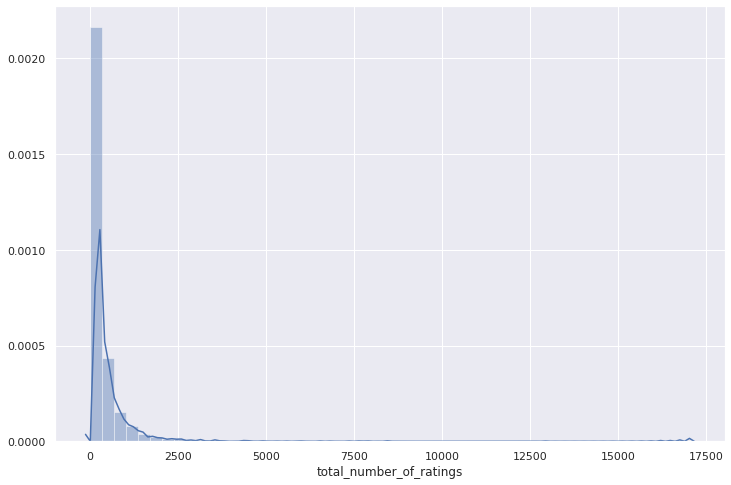

In [151]:
sns.set(rc={'figure.figsize':(12,8)})
sns.distplot(matching.total_number_of_ratings)

In [152]:
matching.total_number_of_ratings.mode()

0    1.0
dtype: float64

As number of ratings seem to follow a power law and most of restaurants have low number of ratings it would be very biased to compare them with restaurants that have tenths of thousands of ratings. Therefore we decide to drop this research question.

## Milestone 3

### Plan of further analysis

Below we present a plan regarding further analysis with respect to particular research questions:

**Question 1:** 
 - visualize and analyze spatial patterns of most common violations, 
 - use violations as a source for "safe to eat" metric for a neighborhood (e.g. with percentage of inspections passed without violations concerning food or a trend in such pass rate).

**Question 2:** 
 - build a better heuristic to evaluate restaurant safety, 
 - use other available features to determine "safe or dangerous" neighborhood (e.g. use the Risk column, narrow down the analysis to certain inspection type).

**Question 3:** 
 - study more indicators of restaurant quality, such as the risk level and violation categories, and their evolution over time,
 - find areas with potential future improvement,
 - inspect whether some restaurant chains follow certain trends.

**Question 4:** 
 - check if there is a relationship between "safe or dangerous" neighborhoods to eat and life quality index in those neighborhoods.


### Data story plan

1. We begin it by general statistics and results based on simple metrics that should bring suspected results (such as the ones we obtained, where the city center and the airport proved to be the safest places to eat).
2. We dive deeper by constructing more complicated metrics based on inspection results and violations.
3. We inspect the trends that can tell us more about how neighborhoods are evolving. It *can* allow for forecasting which neighborhoods might be promising in the near future. This analysis can focus also on certain interesting restaurant chains.
4. We conclude our data story with recommendations of neighborhoods where one may be more interested to eat based on the previously presented metrics and analysis.

Throught our data story we want to make an extensive use of maps to visualize our metrics.

The final presentation will follow the pattern similar to the data story but limited to the most relevant/interesting information and findings.